# **Text to Image Generation using VQ-GAN and CLIP**

In [1]:
from google.colab import output

nvidia_output = !nvidia-smi --query-gpu=memory.total --format=noheader,nounits,csv
gpu_memory = int(nvidia_output[0])
if gpu_memory < 10000:
  output.eval_js('new Audio("https://upload.wikimedia.org/wikipedia/commons/0/05/Beep-09.ogg").play()')
  warning_string = f"--> GPU check: ONLY {gpu_memory} MiB available: Please use low quality or low res <--"
  print(warning_string)
  output.eval_js('alert("Warning - low GPU (see message)")')
else:
  print(f"GPU check: {gpu_memory} MiB available: this should be fine")

from IPython.utils import io
with io.capture_output() as captured:
  !pip install torch==1.9.0+cu102 torchtext==0.10.0 torchvision==0.10.0+cu102 torch-optimizer==0.1.0 -f https://download.pytorch.org/whl/torch/ -f https://download.pytorch.org/whl/torchvision/
  !git clone https://github.com/openai/CLIP
  # !pip install taming-transformers
  !git clone https://github.com/CompVis/taming-transformers.git
  !rm -Rf clipit
  !git clone https://github.com/mfrashad/clipit.git
  !pip install ftfy regex tqdm omegaconf pytorch-lightning
  !pip install kornia==0.6.1
  !pip install imageio-ffmpeg   
  !pip install einops
  !pip install torch-optimizer
  !pip install easydict
  !pip install braceexpand
  !pip install git+https://github.com/pvigier/perlin-numpy

  # ClipDraw deps
  !pip install svgwrite
  !pip install svgpathtools
  !pip install cssutils
  !pip install numba
  !pip install torch-tools
  !pip install visdom

  !pip install gradio==2.3.7

  !git clone https://github.com/BachiLi/diffvg
  %cd diffvg
  # !ls
  !git submodule update --init --recursive
  !python setup.py install
  %cd ..
  
  !mkdir -p steps
  !mkdir -p models

output.clear()
import sys
sys.path.append("clipit")

result_msg = "setup complete"
import IPython
import os
if not os.path.isfile("first_init_complete"):
  # put stuff in here that should only happen once
  !mkdir -p models
  os.mknod("first_init_complete")
  result_msg = "Please choose Runtime -> Restart Runtime from the menu, and then run Setup again"

js_code = f'''
document.querySelector("#output-area").appendChild(document.createTextNode("{result_msg}"));
'''
js_code += '''
for (rule of document.styleSheets[0].cssRules){
  if (rule.selectorText=='body') break
}
rule.style.fontSize = '30px'
'''
display(IPython.display.Javascript(js_code))

<IPython.core.display.Javascript object>

## VQGAN + CLIP --> CLIPIT

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2400256/45929032 bytes (5.2%)5857280/45929032 bytes (12.8%)9412608/45929032 bytes (20.5%)12820480/45929032 bytes (27.9%)16228352/45929032 bytes (35.3%)19562496/45929032 bytes (42.6%)23248896/45929032 bytes (50.6%)26976256/45929032 bytes (58.7%)30588928/45929032 bytes (66.6%)34234368/45929032 bytes (74.5%)37953536/45929032 bytes (82.6%)41533440/45929032 bytes (90.4%)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

8.19kB [00:00, 229kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 145MiB/s]
100%|████████████████████████████████████████| 335M/335M [00:02<00:00, 132MiB/s]


Using device: cuda:0
Optimising using: Adam
Using text prompts: ['underwater city']
Using seed: 18211345965253785591


0it [00:00, ?it/s]

iter: 0, loss: 1.85761, losses: 0.937892, 0.919716


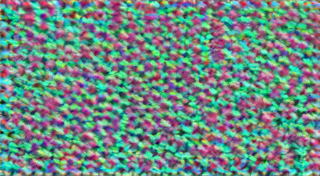

iter: 10, loss: 1.64046, losses: 0.824594, 0.815866
iter: 20, loss: 1.54642, losses: 0.767958, 0.778457


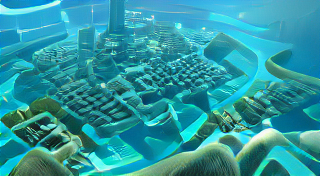

iter: 30, loss: 1.52722, losses: 0.75977, 0.767446
iter: 40, loss: 1.49904, losses: 0.750187, 0.748854


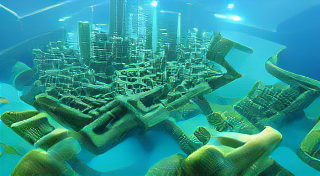

iter: 50, loss: 1.49281, losses: 0.747819, 0.74499
iter: 60, loss: 1.43795, losses: 0.710313, 0.727638


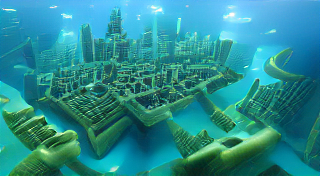

iter: 70, loss: 1.47524, losses: 0.737358, 0.73788
iter: 80, loss: 1.48419, losses: 0.740036, 0.744153


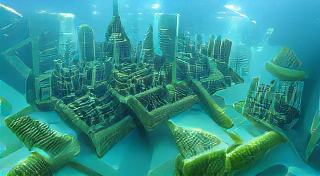

iter: 90, loss: 1.45809, losses: 0.723885, 0.734206
iter: 100, loss: 1.46861, losses: 0.727618, 0.740995


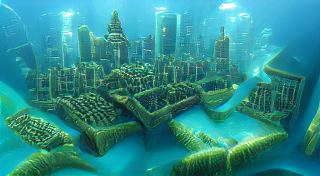

iter: 110, loss: 1.45901, losses: 0.724588, 0.734425
iter: 120, loss: 1.42266, losses: 0.698831, 0.723826


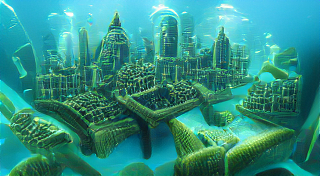

iter: 130, loss: 1.41833, losses: 0.697457, 0.720877
iter: 140, loss: 1.41613, losses: 0.696414, 0.719721


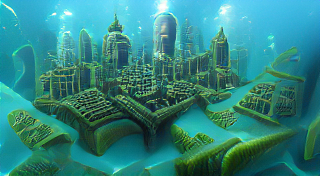

iter: 150, loss: 1.44709, losses: 0.713064, 0.734021
iter: 160, loss: 1.40513, losses: 0.687047, 0.718086


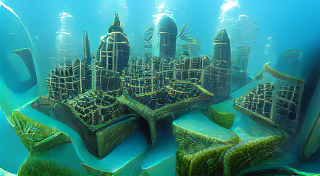

iter: 170, loss: 1.40375, losses: 0.688572, 0.715177
iter: 180, loss: 1.45657, losses: 0.716126, 0.740445


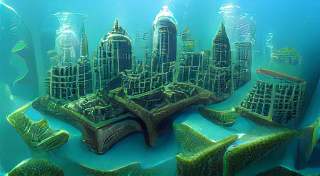

iter: 190, loss: 1.45137, losses: 0.71426, 0.737107
iter: 200, loss: 1.44565, losses: 0.714776, 0.730873


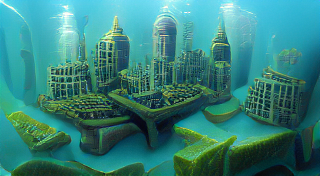

iter: 210, loss: 1.43111, losses: 0.708464, 0.722647
iter: 220, loss: 1.44461, losses: 0.712198, 0.732409


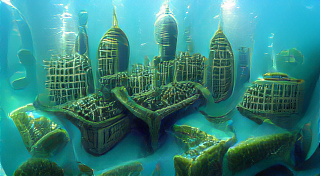

iter: 230, loss: 1.4056, losses: 0.690317, 0.715284
iter: 240, loss: 1.39819, losses: 0.68775, 0.710437


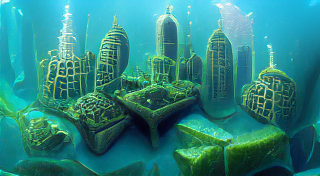

iter: 250, loss: 1.43006, losses: 0.704299, 0.725762
iter: 260, loss: 1.3994, losses: 0.687622, 0.711775


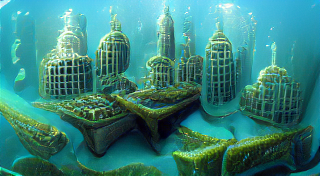

iter: 270, loss: 1.42672, losses: 0.70307, 0.723647
iter: 280, loss: 1.3905, losses: 0.683647, 0.706856


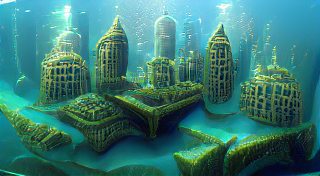

iter: 290, loss: 1.4163, losses: 0.697989, 0.718315
iter: 300, loss: 1.41837, losses: 0.69782, 0.720552


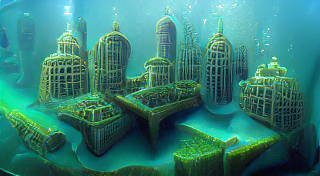

iter: 310, loss: 1.40845, losses: 0.691664, 0.716783
iter: 320, loss: 1.37938, losses: 0.678524, 0.70086


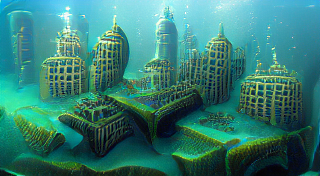

iter: 330, loss: 1.45153, losses: 0.714798, 0.736737
iter: 340, loss: 1.38603, losses: 0.684615, 0.701415


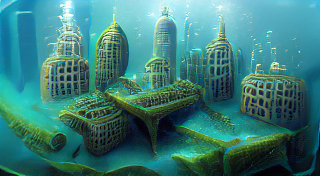

iter: 350, loss: 1.42756, losses: 0.704971, 0.72259


In [2]:
import clipit
# To reset settings to default
clipit.reset_settings()
# You can use "|" to separate multiple prompts
prompts = "underwater city"
# You can trade off speed for quality: draft, normal, better, best
quality = "normal"
# Aspect ratio: widescreen, square
aspect = "widescreen"
# Add settings
clipit.add_settings(prompts=prompts, quality=quality, aspect=aspect)
# Apply these settings and run
settings = clipit.apply_settings()
clipit.do_init(settings)
clipit.do_run(settings)

In [3]:
import random
from PIL import Image, ImageDraw, ImageFont

#Opening Image & Creating New Text Layer
def watermark_image(input_file, output_file):
    img = Image.open(input_file).convert("RGBA")
    txt = Image.new('RGBA', img.size, (255,255,255,0))

    #Creating Text
    text = "Deep Imagify"
    font = ImageFont.load_default()

    #Creating Draw Object
    d = ImageDraw.Draw(txt)

    #Positioning Text
    width, height = img.size 
    textwidth, textheight = d.textsize(text, font)
    x=width-textwidth-1
    y=height-textheight-1

    #Applying Text
    d.text((x,y), text, fill=(255,255,255, 200), font=font)

    #Combining Original Image with Text and Saving
    watermarked = Image.alpha_composite(img, txt)
    watermarked.save(output_file)

IMPORTANT: You are using gradio version 2.3.7, however version 2.5.1 is available, please upgrade.
--------
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)
Running on public URL: https://20434.gradio.app
Interface loading below...


Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['football']
Using seed: 7244333788131652954


0it [00:00, ?it/s]

iter: 0, loss: 1.80229, losses: 0.905902, 0.896387


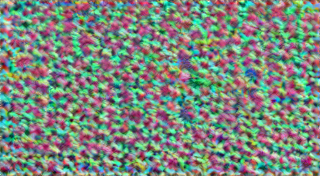

iter: 10, loss: 1.6948, losses: 0.853522, 0.841276
iter: 20, loss: 1.65357, losses: 0.837594, 0.81598


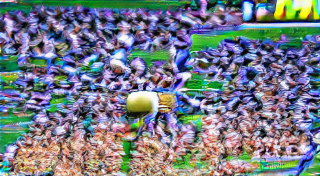

iter: 30, loss: 1.64594, losses: 0.836381, 0.809557
iter: 40, loss: 1.6355, losses: 0.8303, 0.805201


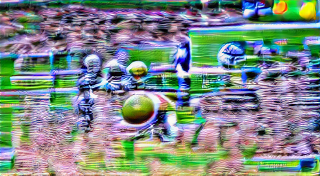

iter: 50, loss: 1.62819, losses: 0.825707, 0.802486
iter: 60, loss: 1.61069, losses: 0.821221, 0.789466


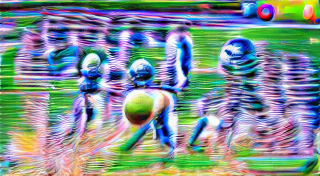

iter: 70, loss: 1.59899, losses: 0.81489, 0.784096
iter: 80, loss: 1.5966, losses: 0.813505, 0.78309


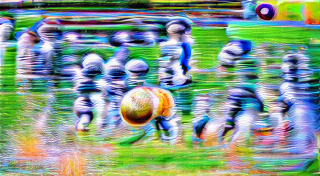

iter: 90, loss: 1.61655, losses: 0.82146, 0.795088
iter: 100, loss: 1.60417, losses: 0.816457, 0.787713


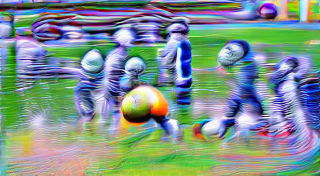

iter: 110, loss: 1.6093, losses: 0.820891, 0.788411
iter: 120, loss: 1.5945, losses: 0.814371, 0.780133


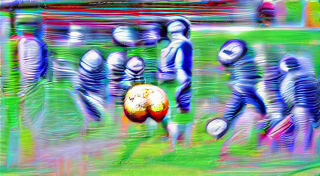

iter: 130, loss: 1.57722, losses: 0.806086, 0.771132
iter: 140, loss: 1.59124, losses: 0.806936, 0.784303


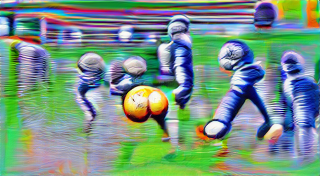

iter: 150, loss: 1.57191, losses: 0.803889, 0.768021
iter: 160, loss: 1.58806, losses: 0.806416, 0.781649


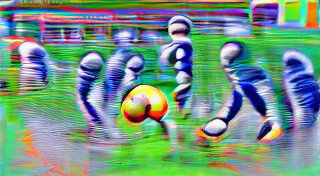

iter: 170, loss: 1.5603, losses: 0.796672, 0.76363
iter: 180, loss: 1.58995, losses: 0.812789, 0.777156


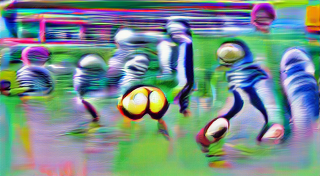

iter: 190, loss: 1.58398, losses: 0.804662, 0.77932
iter: 200, loss: 1.56716, losses: 0.793513, 0.773642


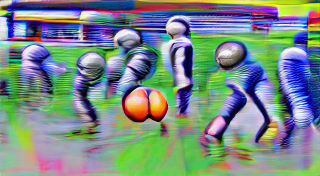

iter: 210, loss: 1.56096, losses: 0.795337, 0.765622
iter: 220, loss: 1.54945, losses: 0.786296, 0.763152


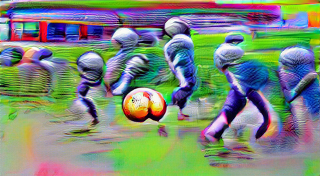

iter: 230, loss: 1.57332, losses: 0.800934, 0.772382
iter: 240, loss: 1.58861, losses: 0.803765, 0.784848


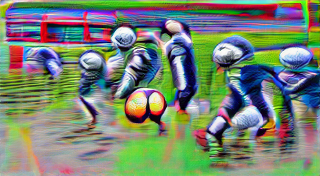

iter: 250, loss: 1.58629, losses: 0.803686, 0.782604
iter: 260, loss: 1.5764, losses: 0.799021, 0.777381


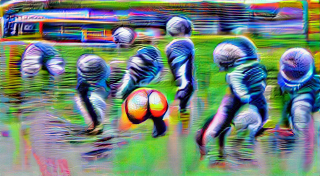

iter: 270, loss: 1.58174, losses: 0.80398, 0.777758
iter: 280, loss: 1.54751, losses: 0.789754, 0.757751


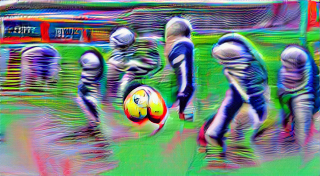

iter: 290, loss: 1.57262, losses: 0.801461, 0.771159
iter: 300, loss: 1.57622, losses: 0.798841, 0.777377


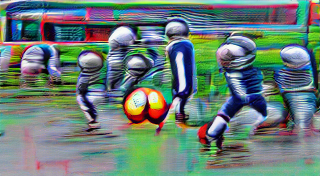

iter: 310, loss: 1.58292, losses: 0.804746, 0.778177
iter: 320, loss: 1.56756, losses: 0.793763, 0.7738


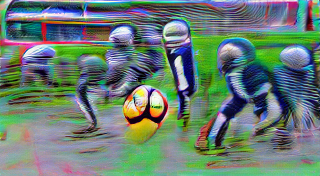

iter: 330, loss: 1.55098, losses: 0.791832, 0.759148
iter: 340, loss: 1.53765, losses: 0.784909, 0.752745


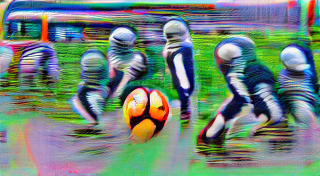

iter: 350, loss: 1.58038, losses: 0.802241, 0.778134
[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|██████████| 350/350 [00:04<00:00, 78.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Midnight city', 'artstation']
Using seed: 9971382442767176678


0it [00:00, ?it/s]

iter: 0, loss: 1.85171, losses: 0.920513, 0.931202


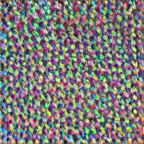

iter: 10, loss: 1.80166, losses: 0.885495, 0.916169
iter: 20, loss: 1.75176, losses: 0.866104, 0.885655


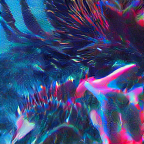

iter: 30, loss: 1.76226, losses: 0.864497, 0.897766
iter: 40, loss: 1.74618, losses: 0.852205, 0.893979


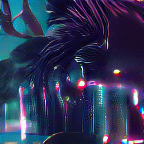

iter: 50, loss: 1.70128, losses: 0.837679, 0.863606
iter: 60, loss: 1.68958, losses: 0.81895, 0.870634


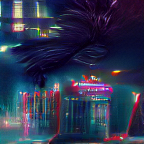

iter: 70, loss: 1.67937, losses: 0.817603, 0.861766
iter: 80, loss: 1.69676, losses: 0.820966, 0.875798


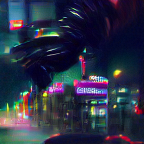

iter: 90, loss: 1.66829, losses: 0.81625, 0.852042
iter: 100, loss: 1.69571, losses: 0.82097, 0.87474


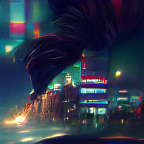

iter: 110, loss: 1.67732, losses: 0.817272, 0.860043
iter: 120, loss: 1.65891, losses: 0.816463, 0.842443


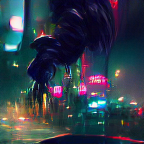

iter: 130, loss: 1.66701, losses: 0.806985, 0.860027
iter: 140, loss: 1.63879, losses: 0.808044, 0.830746


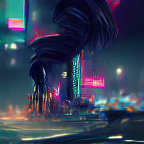

iter: 150, loss: 1.6732, losses: 0.81359, 0.859607
iter: 160, loss: 1.67739, losses: 0.81034, 0.867051


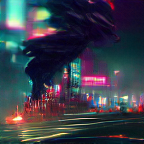

iter: 170, loss: 1.64896, losses: 0.802577, 0.846387
iter: 180, loss: 1.65057, losses: 0.799021, 0.851549


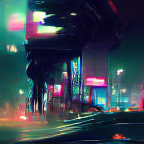

iter: 190, loss: 1.67793, losses: 0.817371, 0.860562
iter: 200, loss: 1.6657, losses: 0.81907, 0.84663


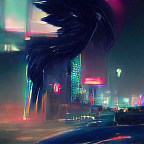

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|██████████| 200/200 [00:01<00:00, 191.25it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Midnight city', 'artstation']
Using seed: 2197932722498323265


0it [00:00, ?it/s]

iter: 0, loss: 3.70313, losses: 0.926951, 0.938624, 0.928225, 0.909333


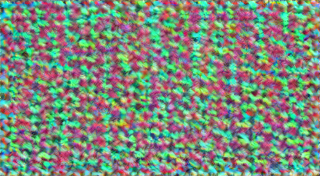

iter: 10, loss: 3.54204, losses: 0.875733, 0.901136, 0.881289, 0.883886
iter: 20, loss: 3.5166, losses: 0.871195, 0.898421, 0.87046, 0.876528


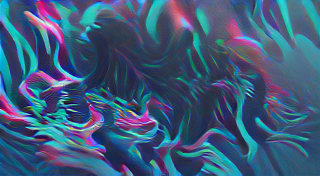

iter: 30, loss: 3.47265, losses: 0.86683, 0.881787, 0.861325, 0.862712
iter: 40, loss: 3.39436, losses: 0.848628, 0.854505, 0.848493, 0.842733


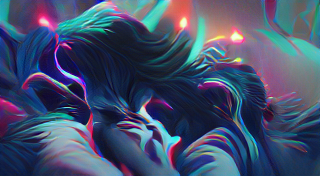

iter: 50, loss: 3.38376, losses: 0.845917, 0.856804, 0.837531, 0.843511
iter: 60, loss: 3.39119, losses: 0.840423, 0.864067, 0.834812, 0.851892


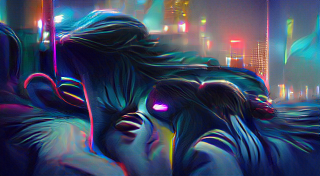

iter: 70, loss: 3.34118, losses: 0.823242, 0.854466, 0.8214, 0.842069
iter: 80, loss: 3.32623, losses: 0.815016, 0.851976, 0.817854, 0.841385


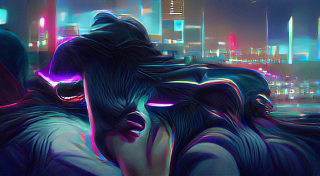

iter: 90, loss: 3.28767, losses: 0.799899, 0.852664, 0.803426, 0.831684
iter: 100, loss: 3.31544, losses: 0.809636, 0.85214, 0.81421, 0.83945


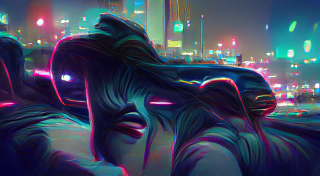

iter: 110, loss: 3.3408, losses: 0.81489, 0.857846, 0.812856, 0.855204
iter: 120, loss: 3.32987, losses: 0.814729, 0.8527, 0.816976, 0.845465


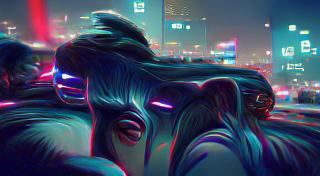

iter: 130, loss: 3.31828, losses: 0.812023, 0.852896, 0.81078, 0.842584
iter: 140, loss: 3.30197, losses: 0.809754, 0.848396, 0.806625, 0.837193


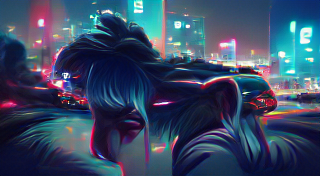

iter: 150, loss: 3.26477, losses: 0.796017, 0.838758, 0.802009, 0.827985
iter: 160, loss: 3.26047, losses: 0.792854, 0.846326, 0.795498, 0.825795


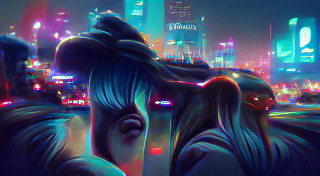

iter: 170, loss: 3.30302, losses: 0.806263, 0.854018, 0.804212, 0.838524
iter: 180, loss: 3.31358, losses: 0.809046, 0.855835, 0.805444, 0.843251


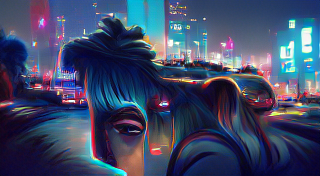

iter: 190, loss: 3.31259, losses: 0.806783, 0.85193, 0.807146, 0.846735
iter: 200, loss: 3.30253, losses: 0.804068, 0.849021, 0.808456, 0.840987


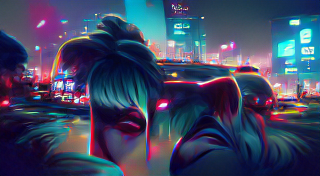

iter: 210, loss: 3.29635, losses: 0.804521, 0.851049, 0.801277, 0.8395
iter: 220, loss: 3.29647, losses: 0.808616, 0.848453, 0.807299, 0.832098


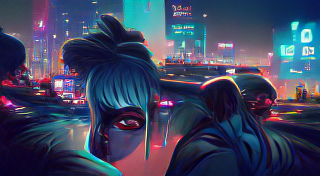

iter: 230, loss: 3.3063, losses: 0.804592, 0.853925, 0.802054, 0.845732
iter: 240, loss: 3.29072, losses: 0.805536, 0.846263, 0.810077, 0.828845


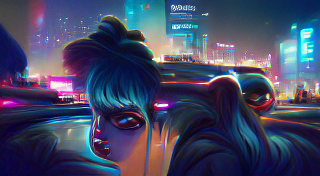

iter: 250, loss: 3.28957, losses: 0.809405, 0.844888, 0.806893, 0.828389
iter: 260, loss: 3.29008, losses: 0.801669, 0.849398, 0.802536, 0.836478


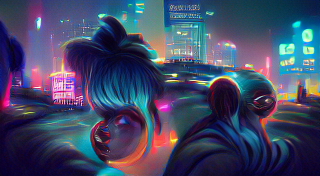

iter: 270, loss: 3.30384, losses: 0.80946, 0.848324, 0.809837, 0.836215
iter: 280, loss: 3.27113, losses: 0.802922, 0.839951, 0.800968, 0.827286


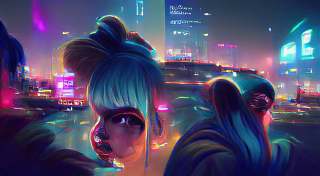

iter: 290, loss: 3.24282, losses: 0.791755, 0.836028, 0.792014, 0.823021
iter: 300, loss: 3.27913, losses: 0.800017, 0.845833, 0.803226, 0.830058


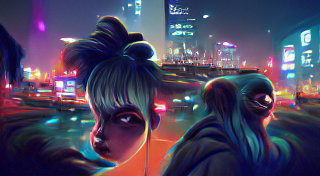

iter: 310, loss: 3.26563, losses: 0.800513, 0.841855, 0.798891, 0.824368
iter: 320, loss: 3.26428, losses: 0.802074, 0.839047, 0.800167, 0.822992


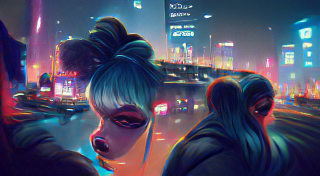

iter: 330, loss: 3.24806, losses: 0.797469, 0.834757, 0.797085, 0.818748
iter: 340, loss: 3.27363, losses: 0.80466, 0.83805, 0.804077, 0.826846


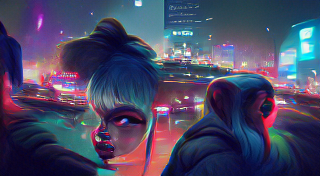

iter: 350, loss: 3.28587, losses: 0.806401, 0.844773, 0.802052, 0.832639
[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|██████████| 350/350 [00:05<00:00, 63.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Global Warming', 'artstation']
Using seed: 14395449704944713081


0it [00:00, ?it/s]

iter: 0, loss: 1.84471, losses: 0.922427, 0.922287


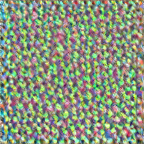

iter: 10, loss: 1.80139, losses: 0.89115, 0.910243
iter: 20, loss: 1.81171, losses: 0.899811, 0.911898


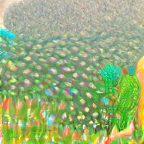

iter: 30, loss: 1.77464, losses: 0.879005, 0.895639
iter: 40, loss: 1.76392, losses: 0.867201, 0.896716


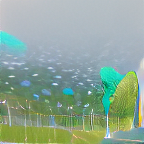

iter: 50, loss: 1.73963, losses: 0.860758, 0.878874
iter: 60, loss: 1.76541, losses: 0.870494, 0.894913


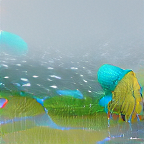

iter: 70, loss: 1.75639, losses: 0.868879, 0.887516
iter: 80, loss: 1.72054, losses: 0.852755, 0.867786


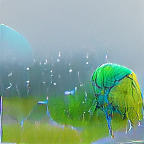

iter: 90, loss: 1.75122, losses: 0.87565, 0.875574
iter: 100, loss: 1.74023, losses: 0.863385, 0.876841


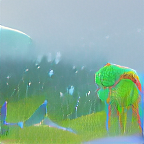

iter: 110, loss: 1.73586, losses: 0.857501, 0.878358
iter: 120, loss: 1.73888, losses: 0.849886, 0.88899


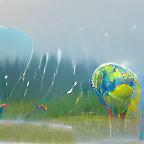

iter: 130, loss: 1.70318, losses: 0.829259, 0.873926
iter: 140, loss: 1.73417, losses: 0.849975, 0.884198


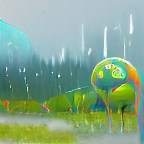

iter: 150, loss: 1.71748, losses: 0.833485, 0.883992
iter: 160, loss: 1.70184, losses: 0.82409, 0.877747


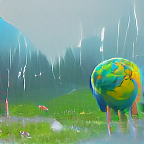

iter: 170, loss: 1.66245, losses: 0.808795, 0.853656
iter: 180, loss: 1.6942, losses: 0.823929, 0.870271


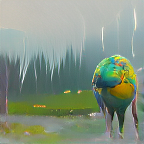

iter: 190, loss: 1.71436, losses: 0.828539, 0.885817
iter: 200, loss: 1.68421, losses: 0.803909, 0.880302


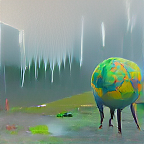

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|██████████| 200/200 [00:01<00:00, 165.08it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt
Using device: cuda:0
Optimising using: Adam
Using text prompts: ['Kansas City', 'artstation']
Using seed: 17123389092809620642


0it [00:00, ?it/s]

iter: 0, loss: 1.8519, losses: 0.923622, 0.928276


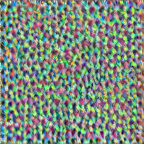

iter: 10, loss: 1.82892, losses: 0.908675, 0.920246
iter: 20, loss: 1.7948, losses: 0.886925, 0.907877


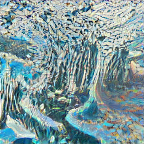

iter: 30, loss: 1.77644, losses: 0.868266, 0.908177
iter: 40, loss: 1.75559, losses: 0.856028, 0.899559


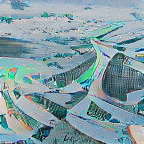

iter: 50, loss: 1.74593, losses: 0.856018, 0.889907
iter: 60, loss: 1.72977, losses: 0.855802, 0.87397


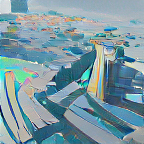

iter: 70, loss: 1.74076, losses: 0.849871, 0.890887
iter: 80, loss: 1.74365, losses: 0.848282, 0.895365


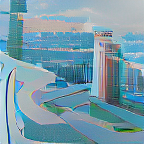

iter: 90, loss: 1.73028, losses: 0.841816, 0.888467
iter: 100, loss: 1.71074, losses: 0.827756, 0.882982


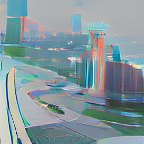

iter: 110, loss: 1.68137, losses: 0.800663, 0.880704
iter: 120, loss: 1.70213, losses: 0.819982, 0.882144


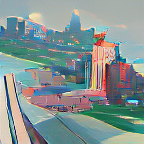

iter: 130, loss: 1.70111, losses: 0.811483, 0.889626
iter: 140, loss: 1.70549, losses: 0.816428, 0.889065


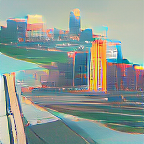

iter: 150, loss: 1.68158, losses: 0.799571, 0.882009
iter: 160, loss: 1.70649, losses: 0.819783, 0.886712


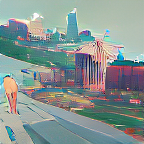

iter: 170, loss: 1.70194, losses: 0.82133, 0.880611
iter: 180, loss: 1.69871, losses: 0.812203, 0.886506


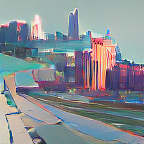

iter: 190, loss: 1.70252, losses: 0.816236, 0.886282
iter: 200, loss: 1.67671, losses: 0.803617, 0.873094


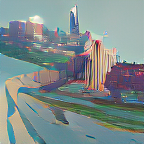

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|██████████| 200/200 [00:01<00:00, 139.95it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 



In [ ]:
import gradio as gr
import torch
import clipit

# Define the main function
def generate(prompt, quality, style, aspect):
    torch.cuda.empty_cache()
    clipit.reset_settings()
    
    use_pixeldraw = (style == 'pixel art')

    use_clipdraw = (style == 'painting')

    clipit.add_settings(prompts=prompt,
                        aspect=aspect,
                        quality=quality,
                        use_pixeldraw=use_pixeldraw,
                        use_clipdraw=use_clipdraw,
                        make_video = True,
                        )
  
    settings = clipit.apply_settings()
    clipit.do_init(settings)
    clipit.do_run(settings)
    watermark_image('output.png', 'output.png')

    return 'output.png', 'output.mp4'

# Create the UI
prompt = gr.inputs.Textbox(default="Underwater city", label="Text Prompt")
quality = gr.inputs.Radio(choices=['draft', 'normal', 'better'], label="Quality")
style = gr.inputs.Radio(choices=['image', 'painting','pixel art'], label="Type")
aspect = gr.inputs.Radio(choices=['square', 'widescreen','portrait'], label="Size")

# Launch the demo
iface = gr.Interface(generate, inputs=[prompt, quality, style, aspect], outputs=['image', 'video'], enable_queue=True, live=False)
iface.launch(debug=True)